# Mask2former
Cuda installation: https://www.cherryservers.com/blog/install-cuda-ubuntu

Paper: https://arxiv.org/pdf/2112.01527.pdf


Installation commands under the working folder (cuda 12.4), source: https://github.com/facebookresearch/Mask2Former/blob/main/INSTALL.md

Env creation:
* conda create --name mask2former python=3.8 -y
* conda activate mask2former

Pytorch and Opencv installation:
* conda install pytorch torchvision torchaudio pytorch-cuda=12.1 -c pytorch -c nvidia
* pip install -U opencv-python

Detectron2 setup:
* git clone git@github.com:facebookresearch/detectron2.git
* cd detectron2
* pip install -e .
* pip install git+https://github.com/cocodataset/panopticapi.git
* pip install git+https://github.com/mcordts/cityscapesScripts.git

Mask2former setup:
* cd ..
* git clone git@github.com:facebookresearch/Mask2Former.git
* cd Mask2Former
* pip install -r requirements.txt
* cd mask2former/modeling/pixel_decoder/ops
* sh make.sh

Working folder:
* cd ~/wip




In [2]:
import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("Is cuda available: ",torch.cuda.is_available()," \nGPU: ",torch.cuda.get_device_name(0))

torch:  2.2 ; cuda:  2.2.2
Is cuda available:  True  
GPU:  NVIDIA GeForce RTX 3080 Ti


In [3]:
#Check to see if detectron is installed
!conda list | grep detectron

detectron2                0.6                       dev_0    <develop>


In [4]:
#Check to see if mask2former is installed
!conda list | grep multiscaledeformableattention

multiscaledeformableattention 1.0                      pypi_0    pypi


## Testing the provided demo

It runs with no detections:
* (mask2former) (base) pablo@pabloubuntu:~/M2M-wip/Mask2Former/demo$ python demo.py --config-file ../configs/coco/panoptic-segmentation/maskformer2_R50_bs16_50ep.yaml --input input1.jpg 

Now to try it with downloaded weights:
* (mask2former) (base) pablo@pabloubuntu:~/M2M-wip/Mask2Former/demo$ python demo.py --config-file ../configs/coco/panoptic-segmentation/maskformer2_R50_bs16_50ep.yaml --input input1.jpg --opts MODEL.WEIGHTS /home/pablo/M2M-wip/m2mWeights/model_final_94dc52.pkl

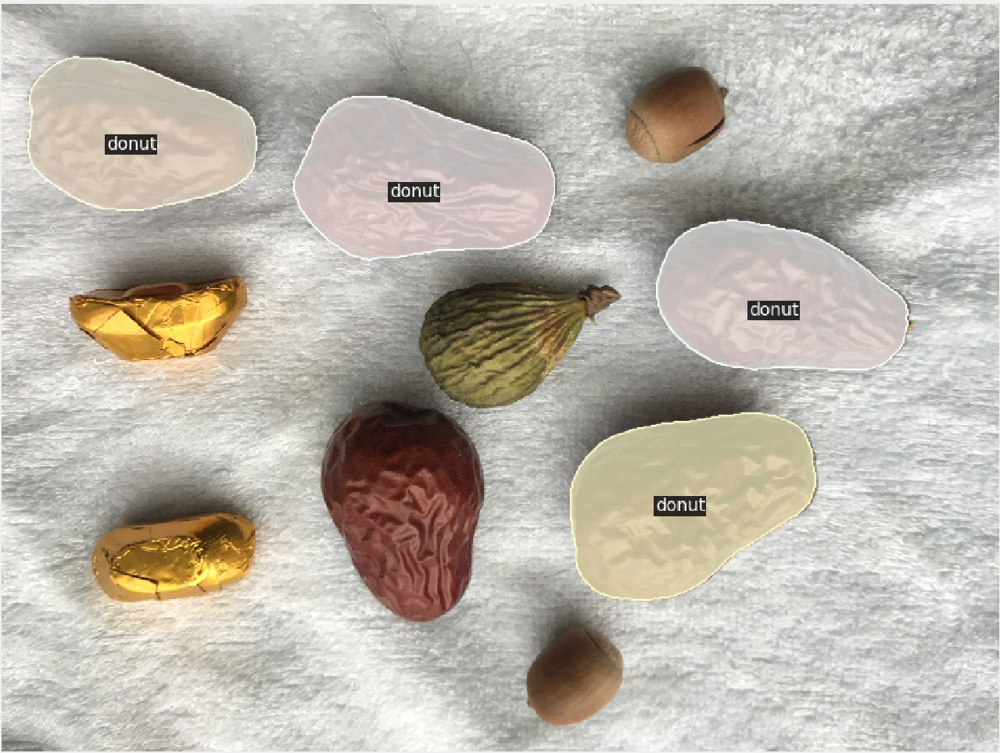

The weights were downloaded from https://github.com/facebookresearch/Mask2Former/blob/main/MODEL_ZOO.md

demo.py source: https://github.com/facebookresearch/Mask2Former/blob/main/GETTING_STARTED.md

## Starting to train
We need to use the train_net.py inside mask2former.

But before we start training we need to setup the datasets folder. When M2M starts training it will look inside $DETECTRON2_DATASETS env variable, it will provide the datasets directory. To set this env var we will do the following ```$export DETECTRON2_DATASETS=/home/pablo/M2M-wip/datasets```, keep in mind that each dataset inside that directory also needs to have a predefined structure.

When working from the citius pc the user names is different so the command wil be: ```export DETECTRON2_DATASETS=/home/pablo.canosa/wip/dataset```

Inside the directory the datasets need to have a specified structure:

Then, run ```python datasets/prepare_coco_semantic_annos_from_panoptic_annos.py```, to extract semantic annotations from panoptic annotations (only used for evaluation).



To start the training phase: 

* python train_net.py --num-gpus 1 --config-file /home/pablo/M2M-wip/Mask2Former/configs/coco/panoptic-segmentation/maskformer2_R50_bs16_50ep.yaml
* python train_net.py --num-gpus 1 --config-file cocoCustomCFG.yaml


torch.cuda.OutOfMemoryError: CUDA out of memory. Tried to allocate 128.00 MiB. GPU 0 has a total capacity of 7.77 GiB of which 112.81 MiB is free. Including non-PyTorch memory, this process has 7.27 GiB memory in use. Of the allocated memory 6.87 GiB is allocated by PyTorch, and 227.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


## Configs

In the paper the authors say "This new training strategy effectively reduces training memory by 3×, from 18GB to 6GB per image, making Mask2Former more accessible to users with limited computational resources." so now it is working with the original config but with a batch size of 2 images.

The configs are stored in "Mask2Former/configs/coco/panoptic-segmentation" and there are two main files: "Base-COCO-PanopticSegmentation.yaml" and another one that runs above it. To change the batch size you need to modify in the base one the following hyperparameter: `IMS_PER_BATCH: 2`

## First training
Now I have a mask2former weight set trained on the COCO dataset, it took around 2 days and 5 hours (53h), it took longer than I expected. I think that the main cause was the batch size of 2 images, in the paper and in the default config they use 16. (Each image as stated by the paper uses aroung 6 gb, I had 12 gb).

In the repo the devs state that "The configs are made for 8-GPU training. Since we use ADAMW optimizer, it is not clear how to scale learning rate with batch size. To train on 1 GPU, you need to figure out learning rate and batch size by yourself"

Also they change them in command line, I changed them in the config files directly (IDK if thats adequate)

To see the model performance evaluation the following command can be used, it sets the model to eval-only, also you have to provide the model checkpoint.

`python train_net.py --num-gpus 1 --config-file /home/pablo.canosa/wip/Mask2Former/configs/coco/panoptic-segmentation/custom_cfg.yaml --eval-only  MODEL.WEIGHTS /home/pablo.canosa/wip/Mask2Former/output/model_final.pth `

To test any image the demo can be used while providing it with the adequate weights checkpoint.

`pablo.canosa@ctdesks70:~/wip/Mask2Former/demo$ python demo.py --config-file /home/pablo.canosa/wip/Mask2Former/configs/coco/panoptic-segmentation/custom_cfg.yaml --input input1.jpg --opts  MODEL.WEIGHTS /home/pablo.canosa/wip/Mask2Former/output/model_final.pth`

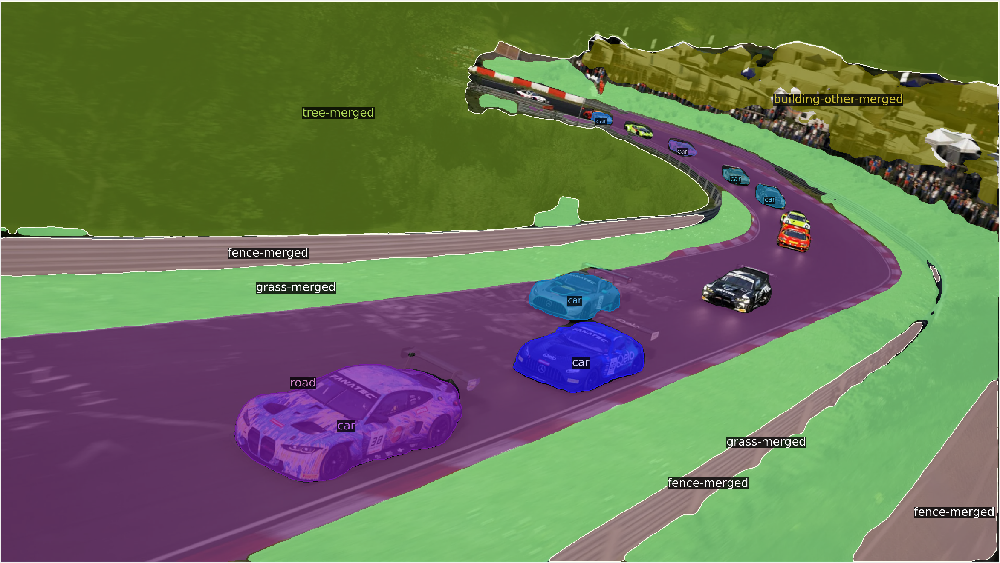

## How to use custom datasets

Im going to try to train mask2former with the cropandweed dataset (https://github.com/cropandweed/cropandweed-dataset) 

The annotations consist of multiple directories for each dataset variant in the following formats:

* bboxes contains csv-files for each image with object instances defined as: Left, Top, Right, Bottom, Label ID, Stem X, Stem Y
* labelIds contains semantic masks for each image
* params contains the following additional parameters for each image:
    *    moisture: 0 (dry), 1 (medium) or 2 (wet)
    *    soil: 0 (fine), 1 (medium) or 2 (coarse)
    *    lighting: 0 (sunny) or 1 (diffuse)
    *    separability: 0 (easy), 1 (medium), 2 (hard)

The corresponding label IDs for each datset variant are specified in datasets.py. The names of all image and annotation files are prefixed either with ave or vwg refering to the Application and Experimental Sets, respectively, as described in the paper. The following 4-digit numbers specify the recording session, while the last 4 digits are the image id.

In [8]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import pandas as pd
import os, json, cv2, random
from matplotlib import pyplot as plt

from shapely.geometry import Polygon

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

from detectron2.structures import BoxMode

username="pablo.canosa"#citius
#username="pablo"# Casa

In [9]:
def get_crops_dicts(bboxes_dir, images_dir, ground_truth_dir):# Por como esta organizado el dataset creo que es mejor empezar desde la carpeta de bboxes
    # Hay que proporcionar un list[dict] que contenga los siguientes campos, se supone que se hace esto una vez para train y otra para eval
    
    dataset_dicts = []

    for bbox_file_idx in os.listdir(bboxes_dir):
        if bbox_file_idx.endswith('.csv'):  
            print(bbox_file_idx,"\n")
            record={}

            bbox_file_path = os.path.join(bboxes_dir, bbox_file_idx)  # Get the full path of the file
            # Read the CSV file as a df
            bbox_df = pd.read_csv(bbox_file_path,header=None)# Contiene un df con una fila para cada bbox de la imagen

            image_id = bbox_file_idx[:-4]# eliminar el .csv para tener el image_id 
                                        # (str or int): a unique id that identifies this image. 
                                        #Required by many evaluators to identify the images, but a dataset may use it for different purposes.


            image_filename_path = os.path.join(images_dir, image_id + '.jpg') #file_name: the full path to the image file.

            height, width = cv2.imread(image_filename_path).shape[:2]

            record["file_name"] = image_filename_path
            record["image_id"] = image_id
            record["height"] = height
            record["width"] = width

            # Bucle para acceder a las anotaciones de cada bbox, se creara un diccionario por cada bbox y se añadirá a la lista annotations (list[dict])
            annotations = []
            for _, row in bbox_df.iterrows():
                bbox_record = {}
                
                bbox_record["bbox"] = [float(row[0]),float(row[1]),float(row[2]),float(row[3])]
                bbox_record["bbox_mode"] = BoxMode.XYXY_ABS
                bbox_record["category_id"] = row[4]
                
                annotations.append(bbox_record)

            record["annotations"] = annotations    

            # ahora hay que proporcionar la direccion a los gt de segmentacion panoptica
            # pan_seg_file_name = os.path.join(ground_truth_dir, image_id + '.jpg')
            
            # Proporcionar la info de los segmentos list[dict] CREO QUE NO LOS TENGO

            # para comprobar si soy capaz de cargar un dataset custom voy a emplear la segmentacion semantica...
            #sem_seg_file_name = os.path.join(ground_truth_dir, image_id + '.png')
            #record["sem_seg_file_name"] = sem_seg_file_name



            #End loop and save dict
            dataset_dicts.append(record)
            #### ESTO ES UNA COSA CUTRE PARA PODER HACER PRUEBAS
            
            if(len(dataset_dicts) == 15):
                break

    return dataset_dicts

In [10]:
train_bboxes_dir = f"/home/{username}/wip/datasets/crop_and_weeds/bboxes/Fine24"
eval_bboxes_dir = f"/home/{username}/wip/datasets/crop_and_weeds/bboxes/Fine24Eval"
images_dir = f"/home/{username}/wip/datasets/crop_and_weeds/images"
gt_images_dir = f"/home/{username}/wip/datasets/crop_and_weeds/labelIds/Fine24"

In [ ]:
DatasetCatalog.register("crop_train", lambda : get_crops_dicts(train_bboxes_dir,images_dir,gt_images_dir))
DatasetCatalog.register("crop_eval", lambda : get_crops_dicts(eval_bboxes_dir,images_dir,gt_images_dir))

In [12]:
MetadataCatalog.get("crop_train").thing_classes=["Maize","Sugar beet","Sunflower","Bean",\
    "Pea","Soy","Potato","Pumpkin","Grasses","Thistle","Geranium","Knotweed","Amaranth","Goosefoot",\
    "Potato weed","Chamomile","Crucifer","Crucifer","Poppy","Corn spurry","Mercuries","Solanales","Chickweed","Labiate"]
MetadataCatalog.get("crop_eval").thing_classes=["Maize","Sugar beet","Sunflower","Bean",\
    "Pea","Soy","Potato","Pumpkin","Grasses","Thistle","Geranium","Knotweed","Amaranth","Goosefoot",\
    "Potato weed","Chamomile","Crucifer","Crucifer","Poppy","Corn spurry","Mercuries","Solanales","Chickweed","Labiate"]

crop_metadata = MetadataCatalog.get("crop_train")

In [13]:
dataset_dicts = get_crops_dicts(train_bboxes_dir,images_dir,gt_images_dir)


ave-0523-0016.csv 

ave-0267-0018.csv 

vwg-0714-0031.csv 

ave-0255-0017.csv 

vwg-0110-0005.csv 

ave-0325-0008.csv 

vwg-0298-0001.csv 

ave-0252-0007.csv 

ave-0144-0002.csv 

ave-0365-0002.csv 

vwg-0853-0020.csv 

vwg-0847-0002.csv 

ave-0361-0010.csv 

vwg-1287-0014.csv 

ave-0593-0003.csv 



In [14]:
# mostrar imagenes de crops para ver si se cargan bien

# This code snippet is taken from the dectectron colab tutorial on how to load custom datasets. It is used to check if the dictionary with the metadata was correctly created.
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=crop_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2.imshow("Prueba",out.get_image()[:, :, ::-1])
    cv2.waitKey(0) 
  
    # closing all open windows 
    cv2.destroyAllWindows() 

### Images from the crops and weeds dataset
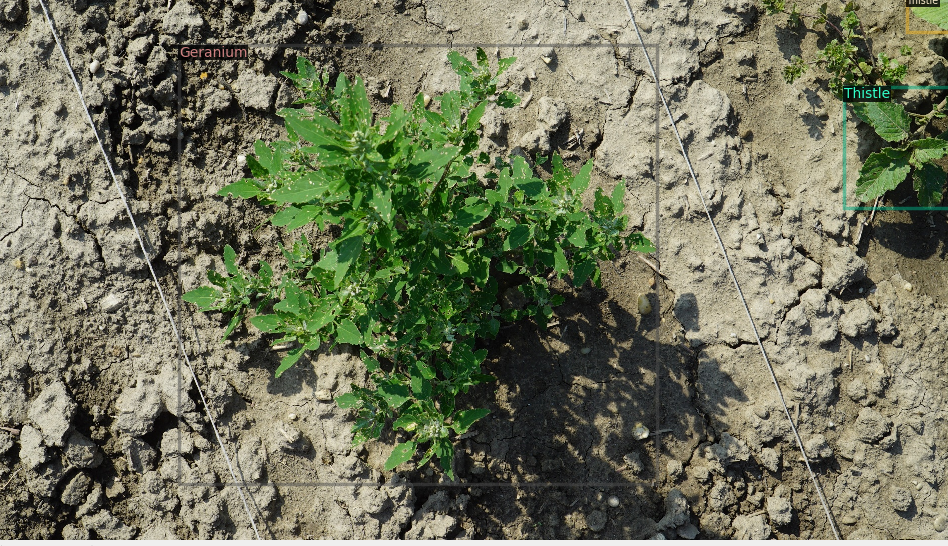



## Custom dataset training trials

* python train_net.py --num-gpus 1 --config-file /home/pablo.canosa/wip/Mask2Former/configs/crop_and_weeds/instance-segmentation/maskformer2_R50_bs16_50ep.yaml

original mask shape : (1088, 1920)
24


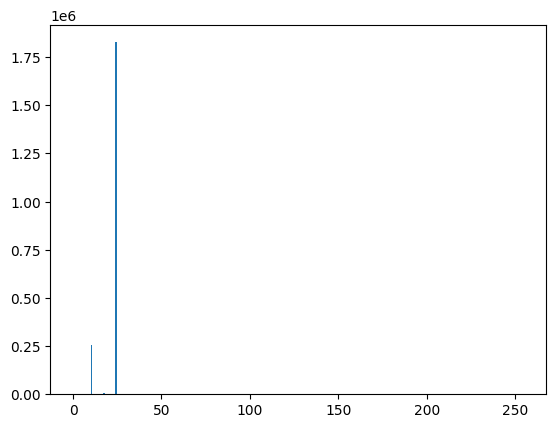

Classes repesented in the mask  [10 17]


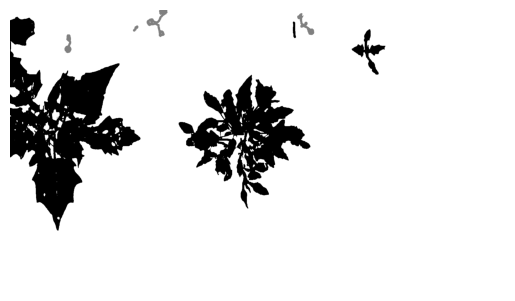

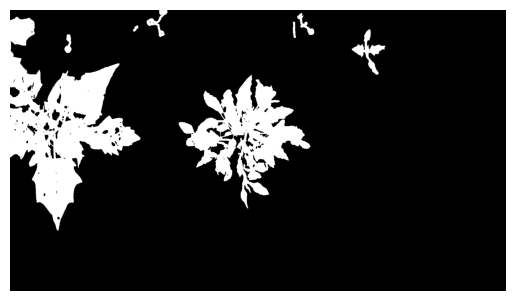

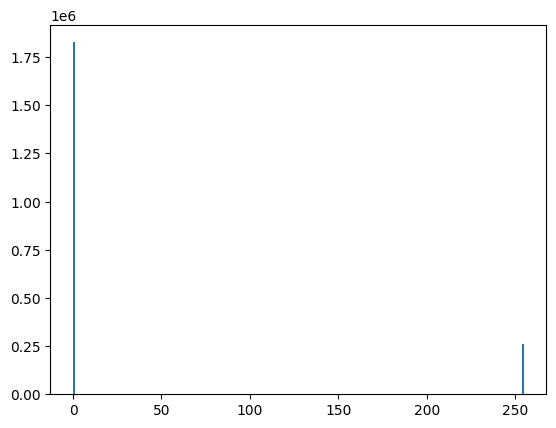

935 254
poligon 0, number of pixels = 154.0
rep point (905, 504)
poligon 0 class is 10
230 98
poligon 1, number of pixels = 77.0
rep point (226, 139)
poligon 1 class is 17
1391 78
poligon 2, number of pixels = 117.0
rep point (1388, 161)
poligon 2 class is 10
494 64
poligon 3, number of pixels = 34.0
rep point (487, 73)
poligon 3 class is 17
1098 48
poligon 4, number of pixels = 31.0
rep point (1099, 82)
poligon 4 class is 10
26 30
poligon 5, number of pixels = 137.0
rep point (200, 417)
poligon 5 class is 10
1124 17
poligon 6, number of pixels = 139.0
rep point (1143, 60)
poligon 6 class is 17
608 0
poligon 7, number of pixels = 129.0
rep point (574, 55)
poligon 7 class is 24
Polygon image shape:  (1088, 1920)


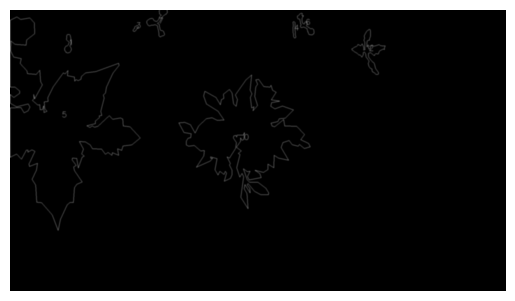

In [15]:
# Esto va a ser problematico porque tal y como funciona lo de cargar los datasets customs tengo que sacar el poligono a partir de la bbox, o así es como lo entiendo

image_path = f"/home/{username}/wip/datasets/crop_and_weeds/labelIds/Fine24/vwg-0532-0010.png"


def get_representative_polygon_point(polygon):# This code was used to try to find a point inside each polygon, it wasnt useful in the end. Now I use it to print the polygons number
    x_sum = 0
    y_sum = 0
    num_points = len(polygon)
    for point in polygon:
        x_sum += point[0][0]
        y_sum += point[0][1]
    average_x = int(x_sum / num_points)
    average_y = int(y_sum / num_points)
    
    #Returns the average position of the vertices
    return (average_x, average_y)


img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
print("original mask shape :",img.shape)
 
print(img[0][0])
plt.hist(img.ravel(),255,[0,255]); plt.show()

arr = img.ravel()
mask = arr !=24
unique_classes = np.unique(arr[mask])
print("Classes repesented in the mask ", unique_classes)

#Show original mask
plt.imshow(img, cmap='gray')
plt.axis('off')  # Turn off axis
plt.show()



_, image_mask_background = cv2.threshold(img, 23, 255, cv2.THRESH_BINARY_INV)

#Show inverted image
plt.imshow(image_mask_background, cmap='gray')
plt.axis('off')  # Turn off axis
plt.show()

plt.hist(image_mask_background.ravel(),255,[0,255]); plt.show()




# Find contours in the binary mask
contours, _ = cv2.findContours(image_mask_background, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Iterate over the contours and approximate polygons
polygons = []
class_coords = []
for idx, contour in enumerate(contours):
    epsilon = 0.001 * cv2.arcLength(contour, True)# Smaller values better results
    polygon = cv2.approxPolyDP(contour, epsilon, True)
    polygons.append(polygon)
    polygon_to_store = polygon.flatten()

    print(polygon_to_store[0],polygon_to_store[1])
    print(f"poligon {idx}, number of pixels = {len(polygon.flatten())/2}")


    ## tratar de conseguir el valor de cada clase inutil por como se leen al crear el diccionario
    rep_point = get_representative_polygon_point(polygon)
    print("rep point" ,rep_point)
    print(f"poligon {idx} class is {img[rep_point[1]][rep_point[0]]}")### tienes que darselas de la forma y x
    class_coords.append(rep_point)


# Draw the detected polygons on a blank image
polygon_image = np.zeros_like(img)
print("Polygon image shape: ",polygon_image.shape)
for idx, point in enumerate(class_coords):
    # Draw number at each class coordinate
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 1
    font_color = (255, 255, 255)  
    thickness = 1
    cv2.putText(polygon_image, str(idx), point, font, font_scale, font_color, thickness)


cv2.drawContours(polygon_image, polygons, -1, (255), 1)

# Show the image with polygons
plt.imshow(polygon_image, cmap='gray', interpolation='bicubic')
plt.axis('off')  # Turn off axis
plt.show()

cv2.imshow('Polygons from Masks', polygon_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

Now I have all the polygons of a mask. Now I should try to find which polygon is represented in a given bbox so that it can be loaded in the dictionary.

In [16]:
#the polygons are stored in the variable "polygons"

# Function to calculate the intersection area between a bounding box and a polygon VERSION VIEJA
""" def intersection_area(bbox, polygon):
    # Convert bounding box to polygon format
    bbox_polygon = np.array([[bbox[0], bbox[1]], [bbox[2], bbox[1]], [bbox[2], bbox[3]], [bbox[0], bbox[3]]], dtype=np.float32)
    # Compute the intersection area
    intersection = cv2.intersectConvexConvex(polygon.astype(np.float32), bbox_polygon.astype(np.float32))[1]
    if intersection is not None:
        return cv2.contourArea(intersection)
    else:
        return 0.0
     """

def intersection_area(bbox, polygon):
    if(len(polygon)<4):
        return 0.0
    
    polygon_plant = Polygon([(point[0][0], point[0][1]) for point in polygon])
    if not polygon_plant.is_valid:
        polygon_plant = polygon_plant.buffer(0)
    bbox_polygon = Polygon([(bbox[0], bbox[1]), (bbox[2], bbox[1]), (bbox[2], bbox[3]), (bbox[0], bbox[3])])

    intersection = polygon_plant.intersection(bbox_polygon).area
    union = polygon_plant.union(bbox_polygon).area
    
    return intersection / union
    

img_path = f"/home/{username}/wip/datasets/crop_and_weeds/images/vwg-0532-0010.jpg"
csv_path = f"/home/{username}/wip/datasets/crop_and_weeds/bboxes/Fine24/vwg-0532-0010.csv"
img=cv2.imread(img_path)
bbox_df = pd.read_csv(csv_path,header=None)
print(bbox_df)

for _, row in bbox_df.iterrows():
    bbox = row[0:4]
    best_polygon = None
    best_intersection = 0.0
    
    best_polygon_idx = None
    for idx, polygon in enumerate(polygons):
        intersection = intersection_area(bbox, polygon)
        if intersection > best_intersection:
            best_intersection = intersection
            best_polygon = polygon
            best_polygon_idx = idx
            
    # Remove the best polygon from the list
    if best_polygon is not None:
        polygons.pop(best_polygon_idx)            
    cv2.rectangle(img, (bbox[0], bbox[1]), (bbox[2], bbox[3]), (0, 255, 0), 2)
    cv2.polylines(img, best_polygon,isClosed=True, color=(0, 255, 0), thickness=2)
    #cv2.fillPoly(img, best_polygon, color=(0, 255, 0))
    
    # Display the image with bounding box and polygon
    cv2.imshow('Image with Bounding Box and Polygon', img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()


      0    1     2    3   4     5    6
0   652  253  1162  770  10   912  484
1   210   97   237  170  17   224  133
2  1322   78  1452  253  10  1387  165
3   475   63   497   87  17   486   75
4  1094   48  1107  112  10  1100   80
5     0   29   505  855  10   141  436
6  1111   15  1177  100  17  1144   58
7   528    0   610  108  17   569   54


## New method to register the dataset that now loads the polygons
It isnt perfect given how the polygons are created. Some polygons are wrong so I implemented hotfixes to get it to work.

The main goal now is to edit how the polygons are created, improving it.

In [17]:

def get_representative_polygon_point(polygon):
    x_sum = 0
    y_sum = 0
    num_points = len(polygon)
    for point in polygon:
        x_sum += point[0][0]
        y_sum += point[0][1]
    average_x = int(x_sum / num_points)
    average_y = int(y_sum / num_points)
    

    return (average_x, average_y)


def get_polygons_from_mask_gt(mask_path):
    img = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    _, image_mask_background = cv2.threshold(img, 23, 255, cv2.THRESH_BINARY_INV)

    # Find contours in the binary mask
    contours, _ = cv2.findContours(image_mask_background, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    #If you use this flag, it returns only extreme outer flags. All child contours are left behind. We can say, under this law, Only the eldest in every family is taken care of. It doesn't care about other members of the family :).

    polygons = []
    for contour in contours:
        epsilon = 0.001 * cv2.arcLength(contour, True)# Smaller values more accurate results
        polygon = cv2.approxPolyDP(contour, epsilon, True)
        polygons.append(polygon)
    return polygons


def intersection_area(bbox, polygon):
    if(len(polygon)<4):
        return 0.0
    
    polygon_plant = Polygon([(point[0][0], point[0][1]) for point in polygon])
    if not polygon_plant.is_valid:
        polygon_plant = polygon_plant.buffer(0)
    bbox_polygon = Polygon([(bbox[0], bbox[1]), (bbox[2], bbox[1]), (bbox[2], bbox[3]), (bbox[0], bbox[3])])

    intersection = polygon_plant.intersection(bbox_polygon).area
    union = polygon_plant.union(bbox_polygon).area
    
    return intersection / union

def get_best_polygon_from_bbox(bbox,polygons):
    best_polygon = None
    best_intersection = 0.0
    
    best_polygon_idx = None
    for idx, polygon in enumerate(polygons):
        intersection = intersection_area(bbox, polygon)
        if intersection > best_intersection:
            best_intersection = intersection
            best_polygon = polygon
            best_polygon_idx = idx
            
    # Remove the best polygon from the list
    #if best_polygon is not None:
    #    polygons.pop(best_polygon_idx)            

    return polygons, best_polygon



def get_crops_dicts(bboxes_dir, images_dir, ground_truth_dir):# Por como esta organizado el dataset creo que es mejor empezar desde la carpeta de bboxes
    # Hay que proporcionar un list[dict] que contenga los siguientes campos, se supone que se hace esto una vez para train y otra para eval
    
    dataset_dicts = []

    for bbox_file_idx in os.listdir(bboxes_dir):
        if bbox_file_idx.endswith('.csv'):  
            print(bbox_file_idx,"\n")
            record={}

            bbox_file_path = os.path.join(bboxes_dir, bbox_file_idx)  # Get the full path of the file
            # Read the CSV file as a df
            bbox_df = pd.read_csv(bbox_file_path, header=None)# Contiene un df con una fila para cada bbox de la imagen

            image_id = bbox_file_idx[:-4]# eliminar el .csv para tener el image_id 
                                        # (str or int): a unique id that identifies this image. 
                                        #Required by many evaluators to identify the images, but a dataset may use it for different purposes.


            image_filename_path = os.path.join(images_dir, image_id + '.jpg') #file_name: the full path to the image file.

            height, width = cv2.imread(image_filename_path).shape[:2]

            record["file_name"] = image_filename_path
            record["image_id"] = image_id
            record["height"] = height
            record["width"] = width

            # Aqui consigo todos los polígonos posibles a partir de cada gt mask
            mask_gt_filepath = os.path.join(ground_truth_dir, image_id + '.png')
            possible_polygons = get_polygons_from_mask_gt(mask_gt_filepath)## Aqui tengo la lista de posibles poligonos
            
            # Bucle para acceder a las anotaciones de cada bbox, se creara un diccionario por cada bbox y se añadirá a la lista annotations (list[dict])
            annotations = []
            for _, row in bbox_df.iterrows():
                bbox_record = {}
                
                bbox_record["bbox"] = [float(row[0]),float(row[1]),float(row[2]),float(row[3])]
                bbox_record["bbox_mode"] = BoxMode.XYXY_ABS
                bbox_record["category_id"] = row[4]
                
                ## aqui a partir de la bbox cojo el mejor poligono lo guardo en el diccionario y lo elimino de la lista de posibles poligonos
                possible_polygons, best_polygon = get_best_polygon_from_bbox(bbox_record["bbox"], possible_polygons)
                if(best_polygon is not None):
                    best_polygon=best_polygon.flatten()
                    if(len(best_polygon)>2):
                        bbox_record["segmentation"] = [best_polygon]
                annotations.append(bbox_record)
            
            record["annotations"] = annotations    

            # ahora hay que proporcionar la direccion a los gt de segmentacion panoptica
            # pan_seg_file_name = os.path.join(ground_truth_dir, image_id + '.jpg')
            
            # Proporcionar la info de los segmentos list[dict] CREO QUE NO LOS TENGO

            # para comprobar si soy capaz de cargar un dataset custom voy a emplear la segmentacion semantica...
            #sem_seg_file_name = os.path.join(ground_truth_dir, image_id + '.png')
            #record["sem_seg_file_name"] = sem_seg_file_name



            #End loop and save dict
            dataset_dicts.append(record)
            #### ESTO ES UNA COSA CUTRE PARA PODER HACER PRUEBAS y que para cuando tenga cargadas n imagenes en el formato compatible con detectron
            if(len(dataset_dicts) == 10):
                break

    return dataset_dicts

In [18]:
train_bboxes_dir = f"/home/{username}/wip/datasets/crop_and_weeds/bboxes/Fine24"
eval_bboxes_dir = f"/home/{username}/wip/datasets/crop_and_weeds/bboxes/Fine24Eval"
images_dir = f"/home/{username}/wip/datasets/crop_and_weeds/images"
gt_images_dir = f"/home/{username}/wip/datasets/crop_and_weeds/labelIds/Fine24"


In [7]:
DatasetCatalog.register("crop_train", lambda : get_crops_dicts(train_bboxes_dir,images_dir,gt_images_dir))
DatasetCatalog.register("crop_eval", lambda : get_crops_dicts(eval_bboxes_dir,images_dir,gt_images_dir))

In [19]:
MetadataCatalog.get("crop_train").thing_classes=["Maize","Sugar beet","Sunflower","Bean",\
    "Pea","Soy","Potato","Pumpkin","Grasses","Thistle","Geranium","Knotweed","Amaranth","Goosefoot",\
    "Potato weed","Chamomile","Crucifer","Crucifer","Poppy","Corn spurry","Mercuries","Solanales","Chickweed","Labiate"]
MetadataCatalog.get("crop_eval").thing_classes=["Maize","Sugar beet","Sunflower","Bean",\
    "Pea","Soy","Potato","Pumpkin","Grasses","Thistle","Geranium","Knotweed","Amaranth","Goosefoot",\
    "Potato weed","Chamomile","Crucifer","Crucifer","Poppy","Corn spurry","Mercuries","Solanales","Chickweed","Labiate"]

crop_metadata = MetadataCatalog.get("crop_train")

In [20]:
dataset_dicts = get_crops_dicts(train_bboxes_dir,images_dir,gt_images_dir)


ave-0523-0016.csv 

ave-0267-0018.csv 

vwg-0714-0031.csv 

ave-0255-0017.csv 

vwg-0110-0005.csv 

ave-0325-0008.csv 

vwg-0298-0001.csv 

ave-0252-0007.csv 

ave-0144-0002.csv 

ave-0365-0002.csv 



In [21]:
# mostrar imagenes de crops para ver si se cargan bien

# This code snippet is taken from the dectectron colab tutorial on how to load custom datasets. It is used to check if the dictionary with the metadata was correctly created.
for d in random.sample(dataset_dicts, 10):
    print(d["file_name"])
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=crop_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2.imshow("Prueba",out.get_image()[:, :, ::-1])
    cv2.waitKey(0) 
  
    # closing all open windows 
    cv2.destroyAllWindows() 

/home/pablo.canosa/wip/datasets/crop_and_weeds/images/ave-0267-0018.jpg
/home/pablo.canosa/wip/datasets/crop_and_weeds/images/ave-0365-0002.jpg
/home/pablo.canosa/wip/datasets/crop_and_weeds/images/ave-0255-0017.jpg
/home/pablo.canosa/wip/datasets/crop_and_weeds/images/ave-0325-0008.jpg
/home/pablo.canosa/wip/datasets/crop_and_weeds/images/ave-0523-0016.jpg
/home/pablo.canosa/wip/datasets/crop_and_weeds/images/vwg-0110-0005.jpg
/home/pablo.canosa/wip/datasets/crop_and_weeds/images/vwg-0714-0031.jpg
/home/pablo.canosa/wip/datasets/crop_and_weeds/images/vwg-0298-0001.jpg
/home/pablo.canosa/wip/datasets/crop_and_weeds/images/ave-0252-0007.jpg
/home/pablo.canosa/wip/datasets/crop_and_weeds/images/ave-0144-0002.jpg


To execute the new version from bash:

*  python train_net_crops.py --num-gpus 1 --config-file /home/pablo.canosa/wip/Mask2Former/configs/crop_and_weeds/instance-segmentation/maskformer2_R50_bs16_50ep.yaml

*  python train_net_crops.py --num-gpus 1 --config-file /home/pablo.canosa/wip/Mask2Former/configs/crop_and_weeds/panoptic-segmentation/maskformer2_R50_bs16_50ep.yaml

Por ahora la segmentacion panoptica no me funciona pero tengo que mirarlo a futuro

## Debug del error anterior
Ahora esta solucionado, por lo menos para una de las imagenes en las que no era capaz de calcular la similitud entre la bbox y el poligono

original mask shape : (1088, 1920)
24


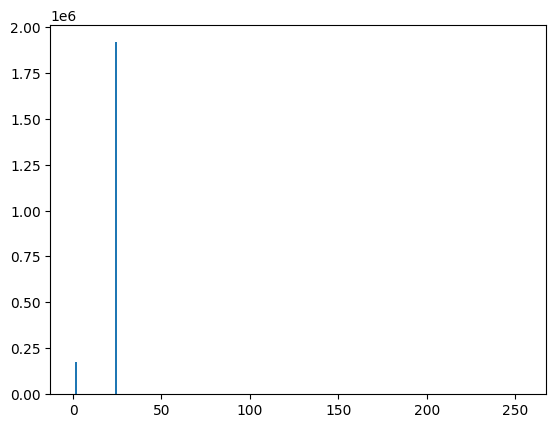

Classes repesented in the mask  [1]


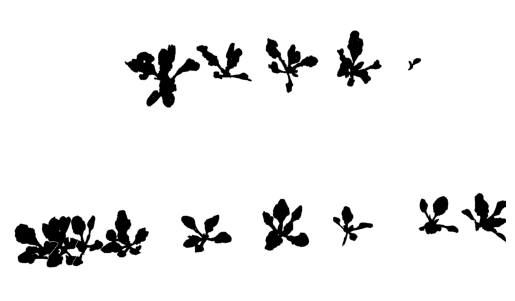

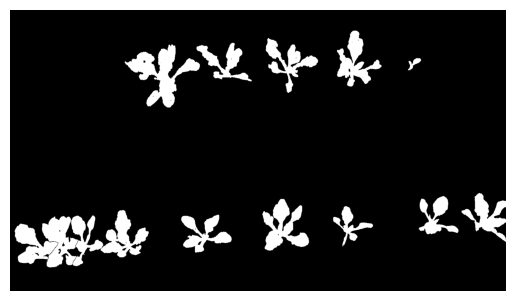

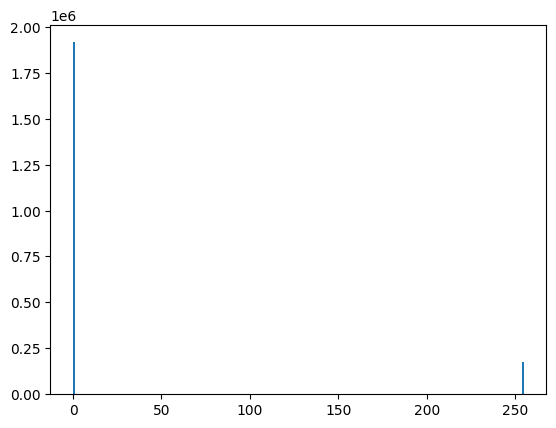

143 972
poligon 0, number of pixels = 4.0
rep point (142, 973)
poligon 0 class is 24
144 968
poligon 1, number of pixels = 1.0
rep point (144, 968)
poligon 1 class is 1
856 880
poligon 2, number of pixels = 119.0
rep point (745, 866)
poligon 2 class is 24
536 859
poligon 3, number of pixels = 156.0
rep point (292, 892)
poligon 3 class is 24
1304 761
poligon 4, number of pixels = 123.0
rep point (1312, 839)
poligon 4 class is 24
981 781
poligon 5, number of pixels = 111.0
rep point (1057, 841)
poligon 5 class is 24
1688 727
poligon 6, number of pixels = 109.0
rep point (1644, 808)
poligon 6 class is 1
1815 710
poligon 7, number of pixels = 119.0
rep point (1847, 805)
poligon 7 class is 24
1588 191
poligon 8, number of pixels = 89.0
rep point (1560, 211)
poligon 8 class is 1
734 213
poligon 9, number of pixels = 131.0
rep point (580, 242)
poligon 9 class is 1
723 145
poligon 10, number of pixels = 113.0
rep point (826, 211)
poligon 10 class is 24
999 112
poligon 11, number of pixels = 14

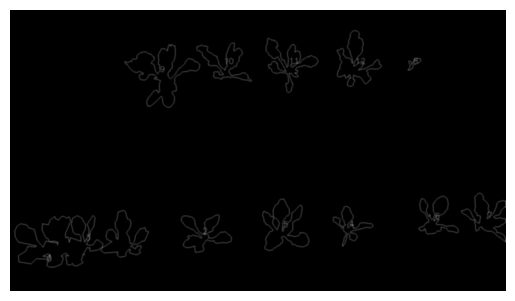

13


In [22]:
# Esto va a ser problematico porque tal y como funciona lo de cargar los datasets customs tengo que sacar el poligono a partir de la bbox, o así es como lo entiendo
#file_to_debug = "ave-0255-0017"# esta antes fallaba pero ahora con el nuevo metodo funciona perfectamente
#file_to_debug = "vwg-1265-0005"# Con esta imagen se puede ver como el detector de poligonos a partir de la mascara une dos instancias
#file_to_debug = "vwg-0853-0020"# algun poligono lo calcula mal

#file_to_debug = "ave-0523-0016"
#file_to_debug = "ave-0267-0018"
#file_to_debug = "vwg-0714-0031"
#file_to_debug = "ave-0255-0017"
#file_to_debug = "vwg-0110-0005"
#file_to_debug = "ave-0325-0008"
#file_to_debug = "vwg-0298-0001"


file_to_debug= "ave-0523-0016"






image_path = f"/home/{username}/wip/datasets/crop_and_weeds/labelIds/Fine24/{file_to_debug}.png"


def get_representative_polygon_point(polygon):# Esto tiene que estar bien
    x_sum = 0
    y_sum = 0
    num_points = len(polygon)
    for point in polygon:
        x_sum += point[0][0]
        y_sum += point[0][1]
    average_x = int(x_sum / num_points)
    average_y = int(y_sum / num_points)
    

    return (average_x, average_y)


img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
print("original mask shape :",img.shape)
 
print(img[0][0])
plt.hist(img.ravel(),255,[0,255]); plt.show()

arr = img.ravel()
mask = arr !=24
unique_classes = np.unique(arr[mask])
print("Classes repesented in the mask ", unique_classes)

#Show original mask
plt.imshow(img, cmap='gray')
plt.axis('off')  # Turn off axis
plt.show()
cv2.imshow('Polygons from Masks', img)
cv2.waitKey(0)
cv2.destroyAllWindows()


_, image_mask_background = cv2.threshold(img, 23, 255, cv2.THRESH_BINARY_INV)

#Show inverted image
plt.imshow(image_mask_background, cmap='gray')
plt.axis('off')  # Turn off axis
plt.show()

plt.hist(image_mask_background.ravel(),255,[0,255]); plt.show()




# Find contours in the binary mask
contours, _ = cv2.findContours(image_mask_background, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Iterate over the contours and approximate polygons
polygons = []
class_coords = []
for idx, contour in enumerate(contours):
    epsilon = 0.001 * cv2.arcLength(contour, True)# Smaller values better results
    polygon = cv2.approxPolyDP(contour, epsilon, True)
    polygons.append(polygon)
    polygon_to_store = polygon.flatten()

    print(polygon_to_store[0],polygon_to_store[1])
    print(f"poligon {idx}, number of pixels = {len(polygon.flatten())/2}")


    ## tratar de conseguir el valor de cada clase
    rep_point = get_representative_polygon_point(polygon)
    print("rep point" ,rep_point)
    print(f"poligon {idx} class is {img[rep_point[1]][rep_point[0]]}")### tienes que darselas de la forma y x
    class_coords.append(rep_point)


# Draw the detected polygons on a blank image
polygon_image = np.zeros_like(img)
print("Polygon image shape: ",polygon_image.shape)
for idx, point in enumerate(class_coords):
    # Draw number at each class coordinate
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 1
    font_color = (255, 255, 255)  
    thickness = 1
    cv2.putText(polygon_image, str(idx), point, font, font_scale, font_color, thickness)


cv2.drawContours(polygon_image, polygons, -1, (255), 1)

# Show the image with polygons
plt.imshow(polygon_image, cmap='gray', interpolation='bicubic')
plt.axis('off')  # Turn off axis
plt.show()

print(len(polygons))
cv2.imshow('Polygons from Masks', polygon_image)
cv2.waitKey(0)
cv2.destroyAllWindows()







In [23]:
#the polygons are stored in the variable "polygons"
##################################################
### NEW SHAPELY VERSION ME DIO MUCHOS PROBELMAS
##################################################



# Function to calculate the intersection area between a bounding box and a polygon
import numpy as np
import cv2

def intersection_area(bbox, polygon):
    if(len(polygon)<4):
        return 0.0
    
    polygon_plant = Polygon([(point[0][0], point[0][1]) for point in polygon])
    if not polygon_plant.is_valid:
        polygon_plant = polygon_plant.buffer(0)
    bbox_polygon = Polygon([(bbox[0], bbox[1]), (bbox[2], bbox[1]), (bbox[2], bbox[3]), (bbox[0], bbox[3])])

    intersection = polygon_plant.intersection(bbox_polygon).area
    union = polygon_plant.union(bbox_polygon).area
    
    return intersection / union

    


img_path = f"/home/{username}/wip/datasets/crop_and_weeds/images/{file_to_debug}.jpg"
csv_path = f"/home/{username}/wip/datasets/crop_and_weeds/bboxes/Fine24/{file_to_debug}.csv"
img=cv2.imread(img_path)
bbox_df = pd.read_csv(csv_path,header=None)
print(bbox_df)
i = 0
for _, row in bbox_df.iterrows():
    bbox = row[0:4]
    best_polygon = None
    best_intersection = 0.0
    
    best_polygon_idx = None
    for idx, polygon in enumerate(polygons):
        intersection = intersection_area(bbox, polygon)
        if intersection > best_intersection:
            best_intersection = intersection
            best_polygon = polygon
            best_polygon_idx = idx
    print(f"best Poly ind {best_polygon_idx}\nScore: {best_intersection}\n")        
    # Remove the best polygon from the list
#    if best_polygon is not None:
#        polygons.pop(best_polygon_idx)            
    cv2.rectangle(img, (bbox[0], bbox[1]), (bbox[2], bbox[3]), (0, 255, 0), 2)

    cv2.polylines(img, best_polygon,isClosed=True, color=(0, 255, 0), thickness=2)

    
    # Display the image with bounding box and polygon
    cv2.imshow('Image with Bounding Box and Polygon', img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
    i+=1

       0    1     2    3  4     5    6
0     18  828   185  984  1   138  933
1    123  798   263  997  1   197  929
2    237  795   360  992  1   278  919
3    662  793   857  940  1   754  885
4    350  775   536  958  1   461  918
5   1250  760  1405  915  1  1305  859
6    977  732  1157  931  1  1046  868
7   1582  722  1736  868  1  1627  823
8   1747  709  1920  900  1  1843  829
9   1540  189  1591  237  1  1554  217
10   444  136   734  380  1   601  276
11   722  130   936  279  1   840  250
12   990  111  1192  324  1  1075  242
13  1265   82  1438  299  1  1321  242
best Poly ind 3
Score: 0.296396613616565

best Poly ind 3
Score: 0.35088794861648426

best Poly ind 3
Score: 0.1704733091344576

best Poly ind 2
Score: 0.39963369963369966

best Poly ind 3
Score: 0.20595091845152977

best Poly ind 4
Score: 0.24882414151925078

best Poly ind 5
Score: 0.46273031825795646

best Poly ind 6
Score: 0.39981764810531933

best Poly ind 7
Score: 0.35753412220440034

best Poly ind 8
Score:

In [24]:
from shapely.geometry import Polygon

def numpy_to_shapely_polygon(numpy_polygon):

    polygon_coords = [(point[0][0], point[0][1]) for point in numpy_polygon]

    return Polygon(polygon_coords)

def iou(poly1, poly2):
    intersection = poly1.intersection(poly2).area
    union = poly1.union(poly2).area
    return intersection / union

row=bbox_df.iloc[3]
bboc_temp = row[0:4]
# Example NumPy arrays representing polygons (replace with your own)
numpy_polygon1 = polygons[2]  # Example coordinates for polygon 1

# Convert NumPy arrays to Shapely Polygons
polygon1 = numpy_to_shapely_polygon(numpy_polygon1)
polygon2 = Polygon([(bboc_temp[0], bboc_temp[1]), (bboc_temp[2], bboc_temp[1]), (bboc_temp[2], bboc_temp[3]), (bboc_temp[0], bboc_temp[3])])

# Calculate IoU score
iou_score = iou(polygon1, polygon2)
print("IoU Score:", iou_score)


IoU Score: 0.39963369963369966


In [25]:
####### THIS CELL PRINTS THE BBOXES FROM THE CSV FILE
img_path = f"/home/{username}/wip/datasets/crop_and_weeds/images/ave-0255-0017.jpg"
img=cv2.imread(img_path)


for _, row in bbox_df.iterrows():
    bbox = row[0:4]
     
    cv2.rectangle(img, (bbox[0], bbox[1]), (bbox[2], bbox[3]), (0, 255, 0), 2)
#    cv2.polylines(img, best_polygon,isClosed=True, color=(0, 255, 0), thickness=2)
cv2.imshow('Image with Bounding Box and Polygon', img)
cv2.waitKey(0)
cv2.destroyAllWindows()

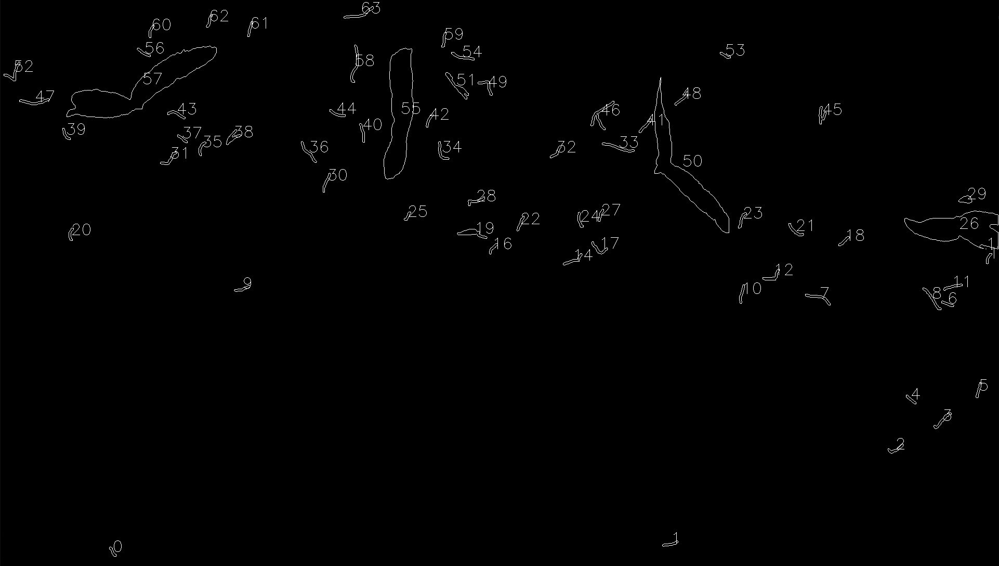

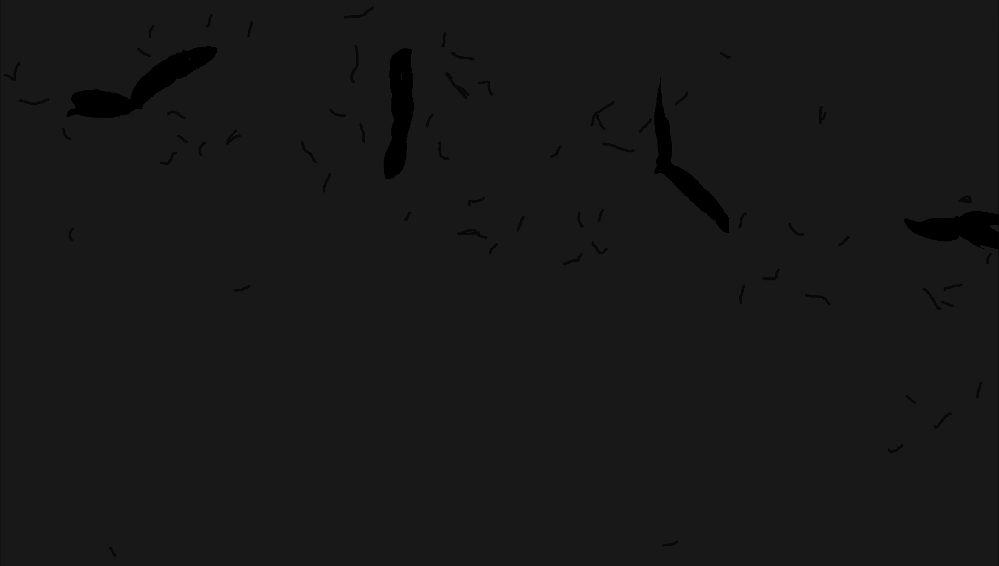

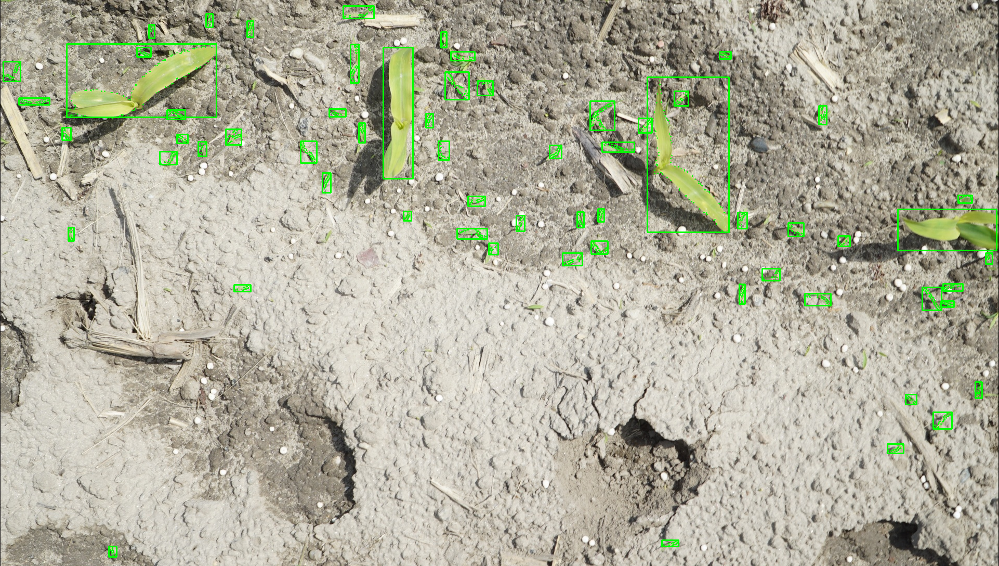

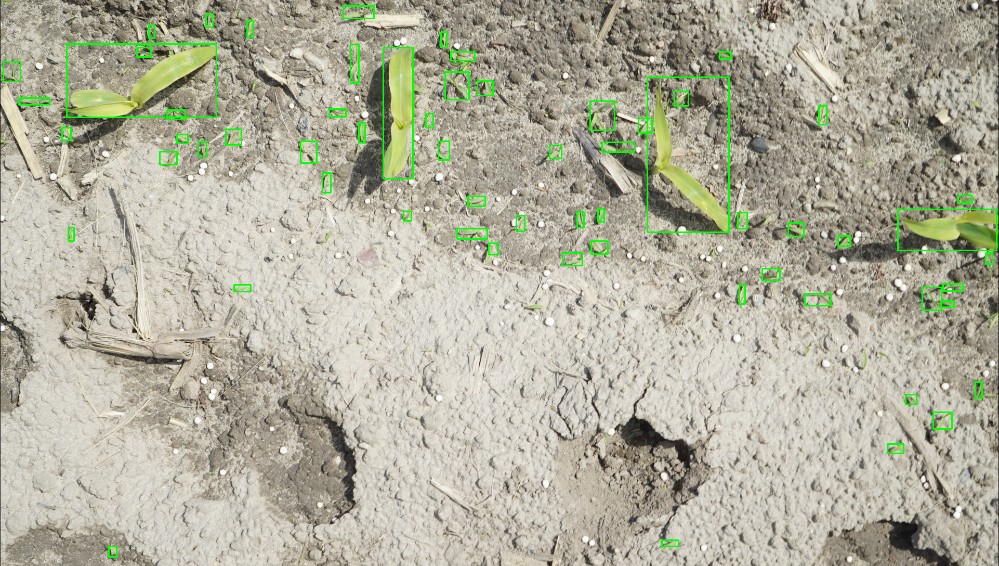